## Importing libraries needed

In [41]:
import pandas as pd 
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium
from folium.plugins import HeatMap

In [42]:

df = pd.read_csv("Datasets/ACE_Violations_PostConj.csv")
df_speeds = pd.read_csv("Datasets/BusSpeeds2025.csv")
df_speeds2 = pd.read_csv("Datasets/BusSpeeds2024.csv")

## Let's preview our data so far

In [43]:
print(df.head(3))
print("-----------------------------------------------------------------------------------")
print(df_speeds.head(3))
print("-----------------------------------------------------------------------------------")
print(df_speeds2.head(3))

   Violation ID                                         Vehicle ID  \
0     488695180  29af8d864d6758cca3c301fabad56e5e27c2bd3688d50f...   
1     488623774  16888160f975233eacabe8ee726e9bbe5c5faaf72ea7c1...   
2     488609748  29af8d864d6758cca3c301fabad56e5e27c2bd3688d50f...   

         First Occurrence         Last Occurrence  Violation Status  \
0  08/13/2025 08:12:16 AM  08/13/2025 08:18:52 AM  VIOLATION ISSUED   
1  07/27/2025 09:49:28 PM  07/27/2025 10:03:27 PM  VIOLATION ISSUED   
2  08/13/2025 06:05:25 AM  08/13/2025 06:12:10 AM  VIOLATION ISSUED   

         Violation Type Bus Route ID  Violation Latitude  Violation Longitude  \
0       MOBILE BUS LANE         BX35           40.849530           -73.934291   
1  MOBILE DOUBLE PARKED        BX12+           40.866168           -73.919078   
2       MOBILE BUS LANE         BX35           40.849545           -73.934300   

   Stop ID              Stop Name  Bus Stop Latitude  Bus Stop Longitude  \
0   403783  WADSWORTH AV/W 181 ST

In [44]:
# Convert violations DataFrame → GeoDataFrame
gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df["Violation Longitude"], df["Violation Latitude"]),
    crs="EPSG:4326"  # Tells geopandas how coordinates interperted on earth
)

In [45]:
# Loading in the boundaries for congestion zone in Central Business District
region = gpd.read_file("map.geojson")

In [46]:
# Getting the violations that are in congestion zone only
violations_in_region = gpd.sjoin(gdf, region, how="inner", predicate="within")

In [47]:
# Printing the basic information we can gather from this dataset
unique_buses = violations_in_region["Bus Route ID"].unique()
print("Total violations in dataset:", len(df))
print("Violations inside region:", len(violations_in_region))
print("Buses with violations in CBD:", unique_buses)
for bus in unique_buses:
    bus_violations = violations_in_region[violations_in_region["Bus Route ID"] == bus]
    print(f"Total violations on {bus} route: {len(bus_violations)}")

Total violations in dataset: 187607
Violations inside region: 15178
Buses with violations in CBD: ['M42' 'M101' 'M15+' 'M14+' 'M34+' 'M23+' 'M2' 'M4']
Total violations on M42 route: 1827
Total violations on M101 route: 2613
Total violations on M15+ route: 6809
Total violations on M14+ route: 1206
Total violations on M34+ route: 647
Total violations on M23+ route: 525
Total violations on M2 route: 1533
Total violations on M4 route: 18


In [48]:

# Get the center of the region to focus the map
center_lat = violations_in_region["Violation Latitude"].mean()
center_lon = violations_in_region["Violation Longitude"].mean()

# Create a folium map
m = folium.Map(location=[center_lat, center_lon], zoom_start=14)

# Add polygon boundary (CBD)
folium.GeoJson("map.geojson", name="CBD").add_to(m)

# Add violations as points
for idx, row in violations_in_region.iterrows():
    folium.CircleMarker(
        location=[row["Violation Latitude"], row["Violation Longitude"]],
        radius=3,
        color='blue',
        fill=True,
        fill_opacity=0.5
    ).add_to(m)

# Display map
m

In [49]:

# List of specific Route IDs to map
selected_routes = ['M15+', 'M14+', 'M34+', 'M23+']

# Filter the violations for only the selected routes
violations_selected = violations_in_region[violations_in_region["Bus Route ID"].isin(selected_routes)]

# Get the center of the region
center_lat = violations_selected["Violation Latitude"].mean()
center_lon = violations_selected["Violation Longitude"].mean()

# Create a folium map
m_heat = folium.Map(location=[center_lat, center_lon], zoom_start=14)

# Add polygon boundary (CBD)
folium.GeoJson("map.geojson", name="CBD").add_to(m_heat)

# Prepare data for heatmap: list of [lat, lon] pairs
heat_data = violations_selected[['Violation Latitude', 'Violation Longitude']].values.tolist()

# Add heatmap layer
HeatMap(heat_data, radius=10, blur=15, max_zoom=15).add_to(m_heat)

# Display map
m_heat


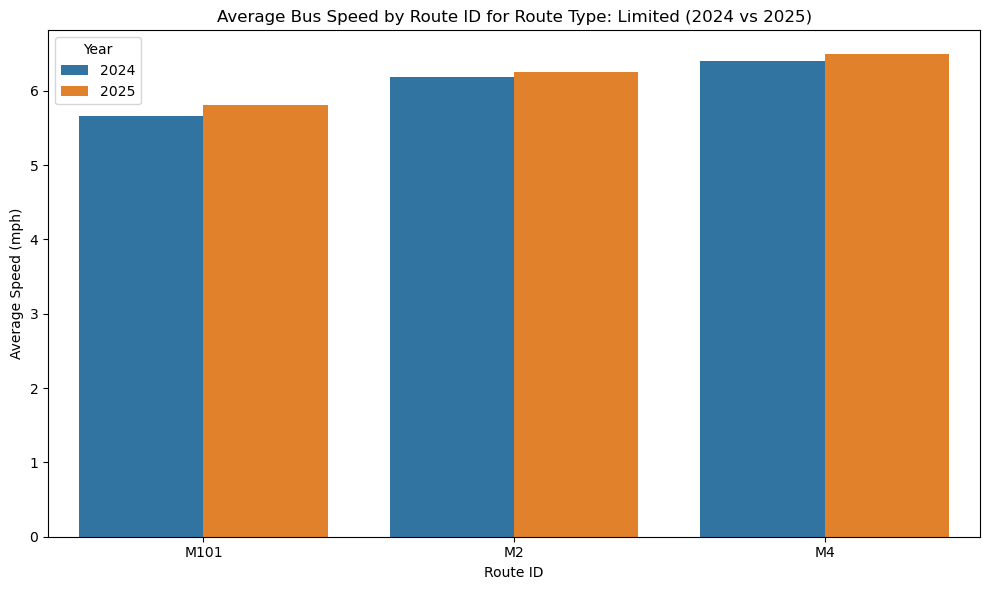

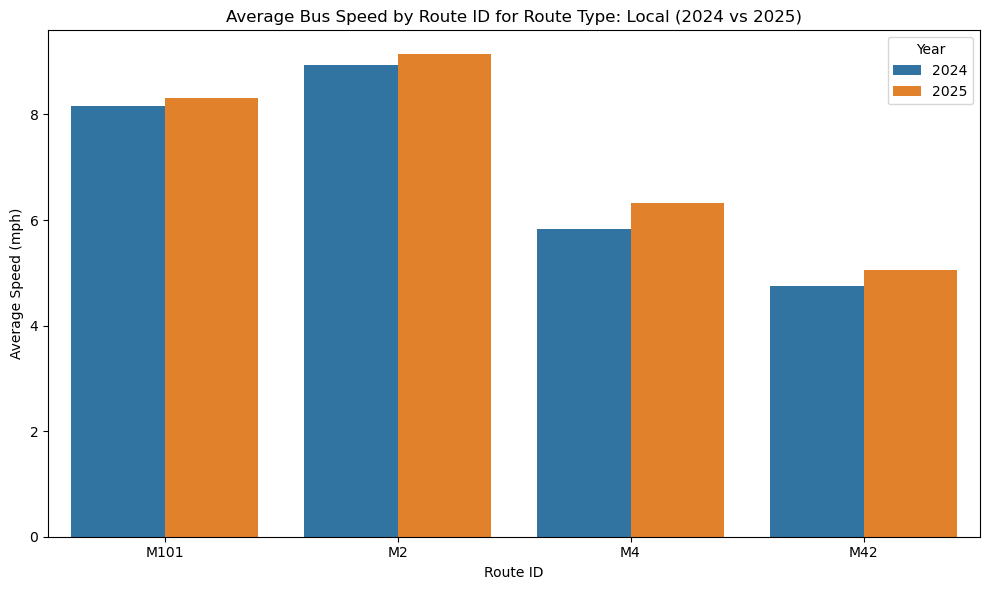

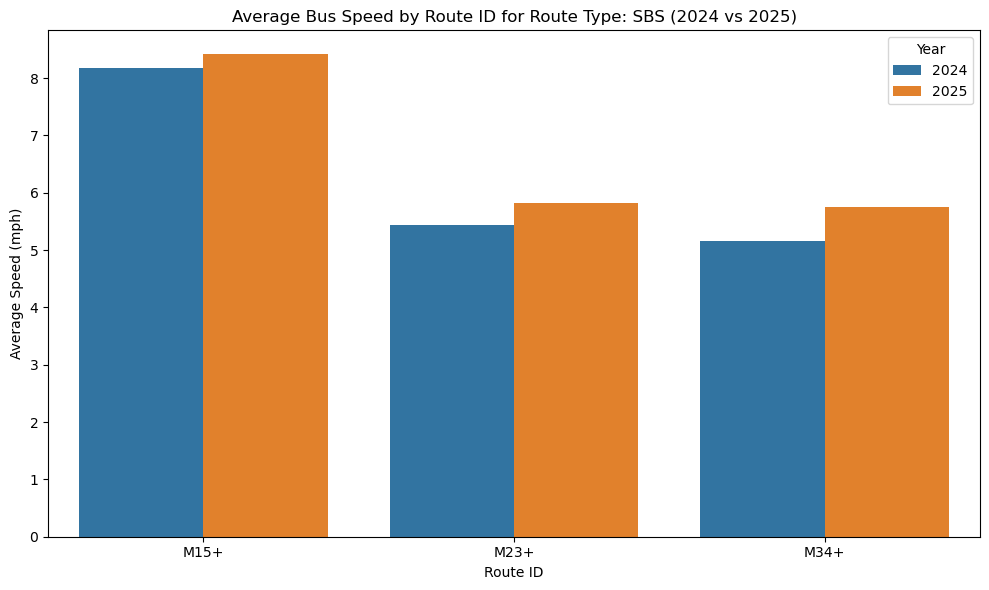

In [50]:
# Group by Route Type and Route ID, compute average speed across all months
avg_speed_2025 = (
    df_speeds
    .groupby(["Route Type", "Route ID"])["Average Road Speed"]
    .mean()
    .reset_index()
)
avg_speed_2024 = (
    df_speeds2
    .groupby(["Route Type", "Route ID"])["Average Road Speed"]
    .mean()
    .reset_index()
)

# Add a column to distinguish year
avg_speed_2025["Data Year"] = "2025"
avg_speed_2024["Data Year"] = "2024"

# Combine both datasets
avg_speed_all = pd.concat([avg_speed_2024, avg_speed_2025])

# Plot separately for each Route Type
route_types = avg_speed_all["Route Type"].unique()

for rtype in route_types:
    plt.figure(figsize=(10,6))
    df_subset = avg_speed_all[avg_speed_all["Route Type"] == rtype]
    
    # Barplot: X = Route ID, Y = Avg Speed, hue = Year
    sns.barplot(
        data=df_subset,
        x="Route ID",
        y="Average Road Speed",
        hue="Data Year",
        errorbar=None
    )
    
    plt.title(f"Average Bus Speed by Route ID for Route Type: {rtype} (2024 vs 2025)")
    plt.xlabel("Route ID")
    plt.ylabel("Average Speed (mph)")
    plt.legend(title="Year")
    plt.tight_layout()
    plt.show()

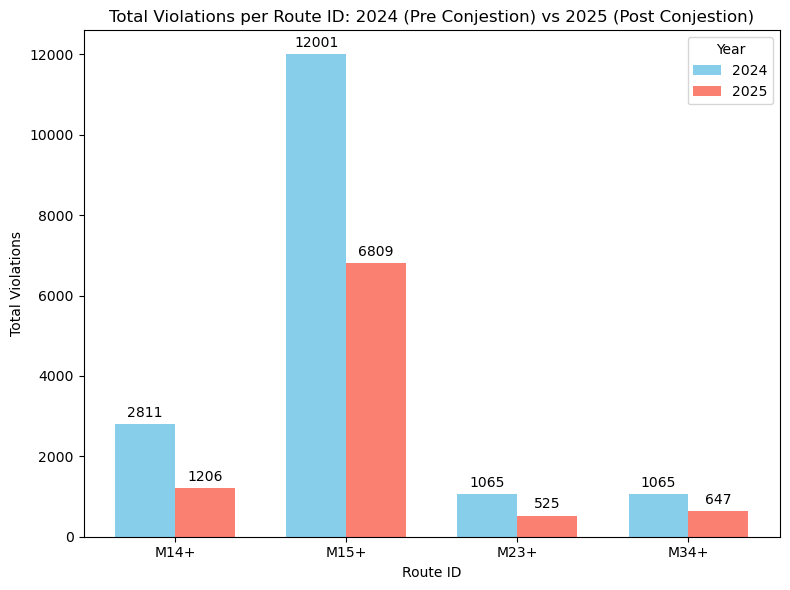

In [51]:

route_ids = ["M14+", "M15+", "M23+", "M34+"]  # X-axis labels
violations_2024 = [2811, 12001, 1065, 1065]        # Hard coded values we got from 2024 data
violations_2025 = [1206, 6809, 525, 647]         # Hard coded values we got from 2025 data

# Set up the bar positions
x = np.arange(len(route_ids))  # the label locations
width = 0.35  # width of the bars

fig, ax = plt.subplots(figsize=(8,6))

# Plot bars for 2024 and 2025
rects1 = ax.bar(x - width/2, violations_2024, width, label="2024", color="skyblue")
rects2 = ax.bar(x + width/2, violations_2025, width, label="2025", color="salmon")

# Labels and Titles
ax.set_ylabel("Total Violations")
ax.set_xlabel("Route ID")
ax.set_title("Total Violations per Route ID: 2024 (Pre Conjestion) vs 2025 (Post Conjestion)")
ax.set_xticks(x)
ax.set_xticklabels(route_ids)
ax.legend(title="Year")

def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height}',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0,3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

plt.tight_layout()
plt.show()


In [52]:
# Calulating percentage decreases for each year:
percentages = []
for i in range(len(violations_2024)):
    percentages.append(violations_2025[i] / violations_2024[i])
    print(f"Violations for {route_ids[i]} decreased by {round(percentages[i] * 100, 2)}%")
average_percentages = round(sum(percentages) / len(percentages) * 100, 2)
print(f"The violations post conjestion had decreased about {average_percentages}% on average.")

Violations for M14+ decreased by 42.9%
Violations for M15+ decreased by 56.74%
Violations for M23+ decreased by 49.3%
Violations for M34+ decreased by 60.75%
The violations post conjestion had decreased about 52.42% on average.


## Time based violation patterns

/var/folders/7x/g0b45n8x1y542ly4zwlfn1xc0000gn/T/ipykernel_71789/1648984719.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  violations_in_region["First Occurrence"] = pd.to_datetime(
/var/folders/7x/g0b45n8x1y542ly4zwlfn1xc0000gn/T/ipykernel_71789/1648984719.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=violations_in_region, x="Hour", palette="viridis")


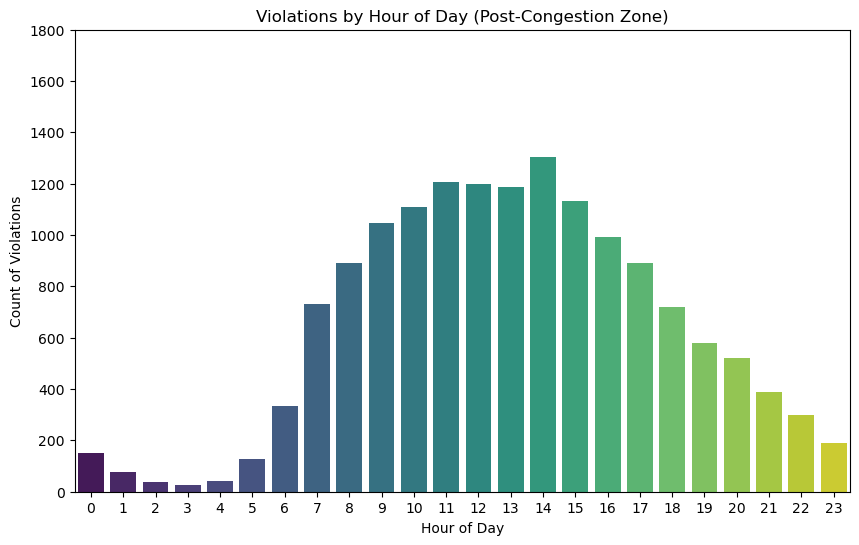

In [53]:
# Convert First Occurrence column to datetime
violations_in_region["First Occurrence"] = pd.to_datetime(
    violations_in_region["First Occurrence"], errors="coerce"
)

# Extract hour
violations_in_region["Hour"] = violations_in_region["First Occurrence"].dt.hour

# Now plot by hour
plt.figure(figsize=(10,6))
sns.countplot(data=violations_in_region, x="Hour", palette="viridis")
plt.title("Violations by Hour of Day (Post-Congestion Zone)")
plt.xlabel("Hour of Day")
plt.ylabel("Count of Violations")

# Force y-axis limit to match 2024 max (adjust value as needed)
plt.ylim(0, 1800)

plt.show()


## Violation type breakdown

/var/folders/7x/g0b45n8x1y542ly4zwlfn1xc0000gn/T/ipykernel_71789/2014368587.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


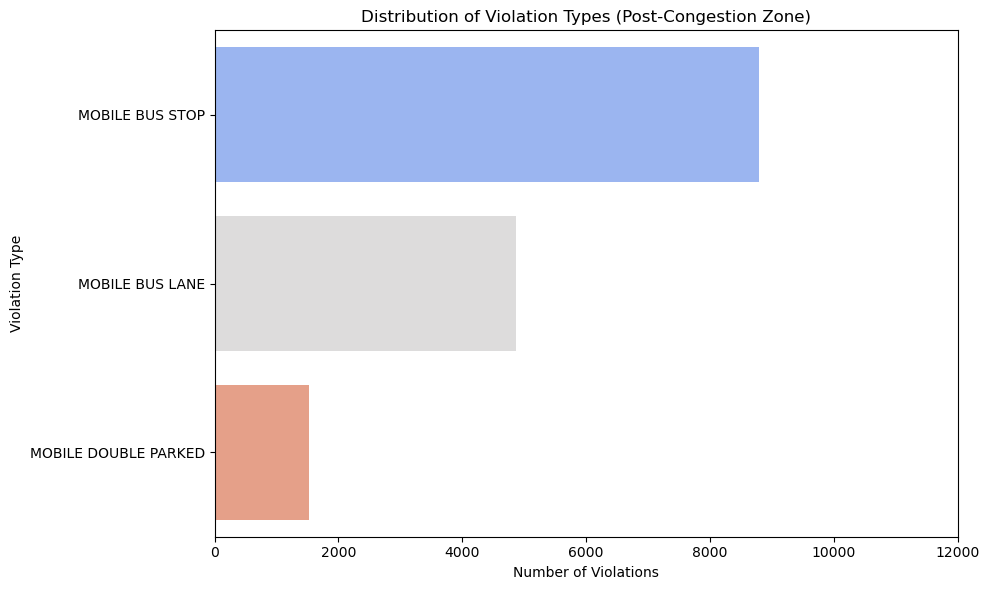

In [54]:
plt.figure(figsize=(10,6))
sns.countplot(
    data=violations_in_region,
    y="Violation Type",
    order=violations_in_region["Violation Type"].value_counts().index,
    palette="coolwarm"
)
plt.title("Distribution of Violation Types (Post-Congestion Zone)")
plt.xlabel("Number of Violations")
plt.ylabel("Violation Type")

# Force x-axis cap at 12,000
plt.xlim(0, 12000)

plt.tight_layout()
plt.show()


## Trip volume vs violations

/var/folders/7x/g0b45n8x1y542ly4zwlfn1xc0000gn/T/ipykernel_71789/4148726903.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=rate, x="Route ID", y="Violations per 1000 Trips", palette="plasma")


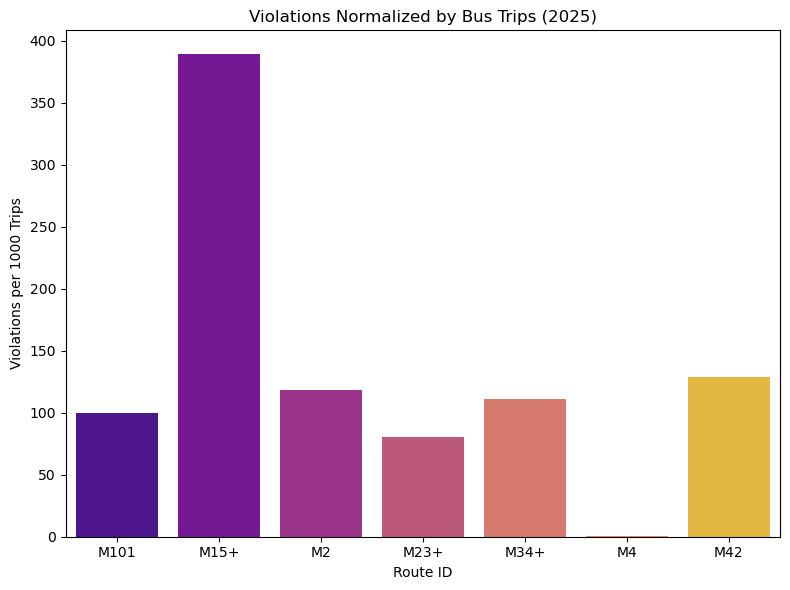

In [55]:
# Calculate violations per trip
trips = df_speeds.groupby("Route ID")["Bus Trip Count"].sum().reset_index()
violations = violations_in_region.groupby("Bus Route ID").size().reset_index(name="Violations")
rate = pd.merge(trips, violations, left_on="Route ID", right_on="Bus Route ID")
rate["Violations per 1000 Trips"] = rate["Violations"] / rate["Bus Trip Count"] * 1000

plt.figure(figsize=(8,6))
sns.barplot(data=rate, x="Route ID", y="Violations per 1000 Trips", palette="plasma")
plt.title("Violations Normalized by Bus Trips (2025)")
plt.ylabel("Violations per 1000 Trips")
plt.tight_layout()
plt.show()


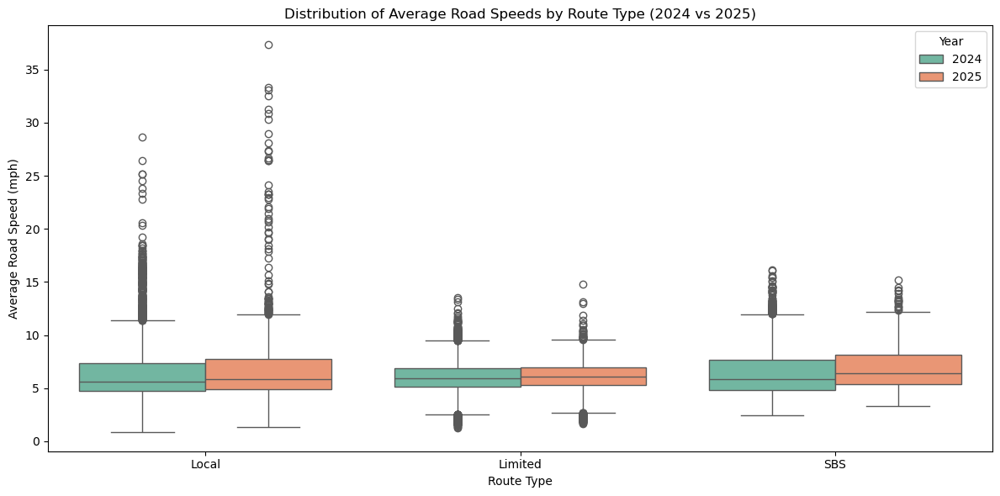

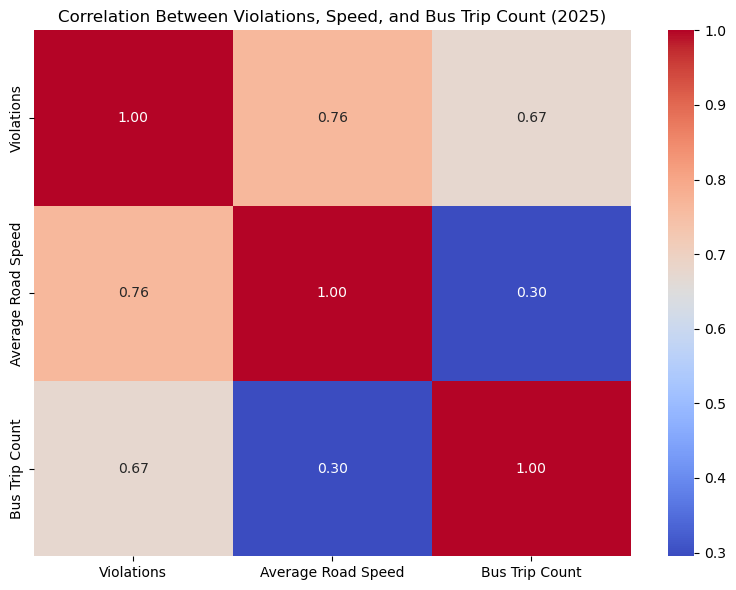

In [56]:
# Add Year column to distinguish datasets
df_speeds["Year"] = 2025
df_speeds2["Year"] = 2024

# Combine datasets
speeds_all = pd.concat([df_speeds2, df_speeds])

plt.figure(figsize=(12,6))
sns.boxplot(
    data=speeds_all, 
    x="Route Type", 
    y="Average Road Speed", 
    hue="Year", 
    palette="Set2"
)
plt.title("Distribution of Average Road Speeds by Route Type (2024 vs 2025)")
plt.xlabel("Route Type")
plt.ylabel("Average Road Speed (mph)")
plt.legend(title="Year")
plt.tight_layout()
plt.show()

# First, aggregate violations by Route ID
violations_count = violations_in_region.groupby("Bus Route ID").size().reset_index(name="Violations")

# Average speed and trip count by Route ID for 2025
speed_summary = df_speeds.groupby("Route ID")[["Average Road Speed", "Bus Trip Count"]].mean().reset_index()

# Merge datasets
summary_df = violations_count.merge(speed_summary, left_on="Bus Route ID", right_on="Route ID")

# Drop Route ID column for correlation
corr_df = summary_df.drop(columns=["Bus Route ID", "Route ID"])

plt.figure(figsize=(8,6))
sns.heatmap(
    corr_df.corr(), 
    annot=True, 
    cmap="coolwarm", 
    fmt=".2f"
)
plt.title("Correlation Between Violations, Speed, and Bus Trip Count (2025)")
plt.tight_layout()
plt.show()


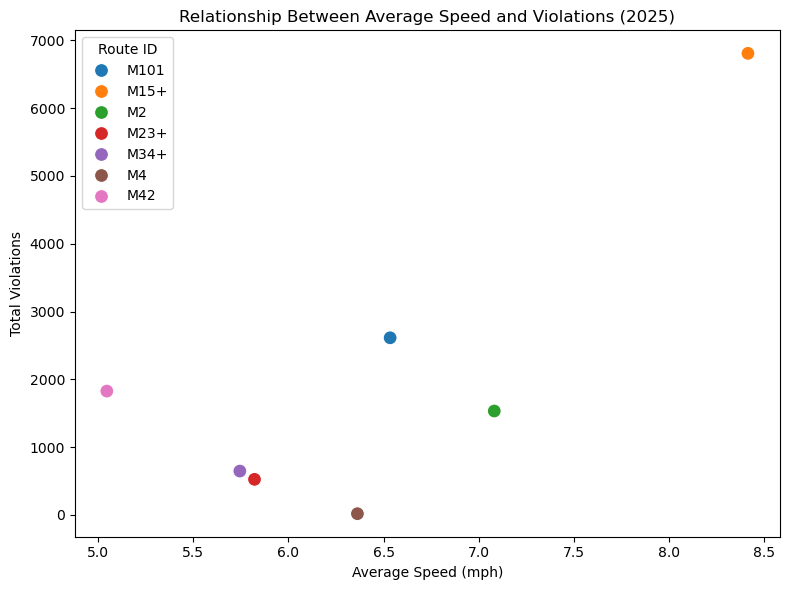

In [57]:
# Merge speed and violation data (only for selected routes)
violations_count = violations_in_region.groupby("Bus Route ID").size().reset_index(name="Violations")
avg_speed = df_speeds.groupby("Route ID")["Average Road Speed"].mean().reset_index()

merged = pd.merge(violations_count, avg_speed, left_on="Bus Route ID", right_on="Route ID")

plt.figure(figsize=(8,6))
sns.scatterplot(data=merged, x="Average Road Speed", y="Violations", hue="Route ID", s=100, palette="tab10")
plt.title("Relationship Between Average Speed and Violations (2025)")
plt.xlabel("Average Speed (mph)")
plt.ylabel("Total Violations")
plt.tight_layout()
plt.show()
